In [1]:
import numpy as np
import pandas as pd
import os
import seaborn as sns

import matplotlib.pyplot as plt
import matplotlib.patches as patches


#from plotly import tools, subplots
#import plotly.offline as py
#py.init_notebook_mode(connected=True)
#import plotly.graph_objs as go
#import plotly.express as px
pd.set_option('max_columns', 100)


os.chdir("/Users/jatinmehta/desktop/kaggle/ashrae/")
os.listdir()



['weather_test.csv',
 'weather_train.csv',
 'test.csv',
 'train.csv',
 'building_metadata.csv',
 'sample_submission.csv']

In [2]:
train_df = pd.read_csv("train.csv")
train_df["timestamp"] = pd.to_datetime(train_df["timestamp"], format='%Y-%m-%d %H:%M:%S')
#Convert argument to datetime.
train_df.head()

,building_id,meter,timestamp,meter_reading
0,0,0,2016-01-01,0.0
1,1,0,2016-01-01,0.0
2,2,0,2016-01-01,0.0
3,3,0,2016-01-01,0.0
4,4,0,2016-01-01,0.0


In [3]:
nrows=train_df.shape[0]
number_of_buildings=train_df['building_id'].nunique()
max_rows_per_building=train_df['building_id'].value_counts().values[0]
min_rows_per_building=train_df['building_id'].value_counts().values[-1]
min_timestamp=train_df['timestamp'].min()
max_timestamp=train_df['timestamp'].max()

In [4]:
print('Number of Rows: ',nrows)
print('number of buildings: ', number_of_buildings)
print('maximum rows per building: ', max_rows_per_building)
print('minimum rows per building: ', min_rows_per_building)
print('minimum meter rating timestamp: ', min_timestamp)
print('maximum meter rating timestamp: ', max_timestamp)

Number of Rows:  20216100
number of buildings:  1449
maximum rows per building:  35136
minimum rows per building:  479
minimum meter rating timestamp:  2016-01-01 00:00:00
maximum meter rating timestamp:  2016-12-31 23:00:00


<BarContainer object of 4 artists>

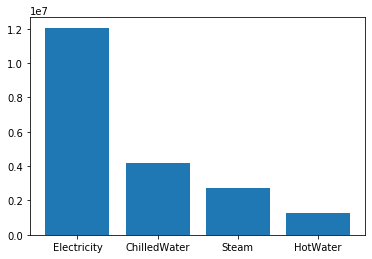

In [5]:
meter_type=train_df['meter'].value_counts()
meter_type=meter_type.sort_index()
meter_type.index=["Electricity", "ChilledWater", "Steam", "HotWater"]
plt.bar(meter_type.index,meter_type)

In [6]:
# Distribution of Meter rating

/Users/jatinmehta/anaconda3/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


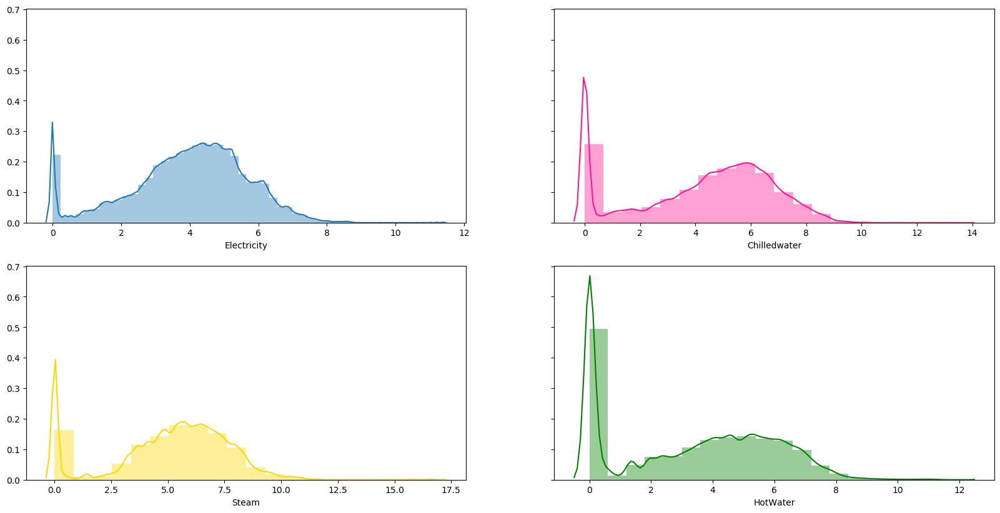

In [7]:
x1 = train_df.loc[train_df.meter==0, ['meter_reading']]
x2 = train_df.loc[train_df.meter==1, ['meter_reading']]
x3 = train_df.loc[train_df.meter==2, ['meter_reading']]
x4 = train_df.loc[train_df.meter==3, ['meter_reading']]
# plot
fig, axes = plt.subplots(2,2, figsize=(20, 10), sharey=True, dpi=100)
axes = axes.flatten()

# log1p(): Return the natural logarithm of one plus the input array, element-wise.
sns.distplot(np.log1p(x1),bins=50,ax=axes[0], axlabel='Electricity')
sns.distplot(np.log1p(x2),bins=20,color="deeppink", ax=axes[1], axlabel='Chilledwater')
sns.distplot(np.log1p(x3),bins=20,color="gold", ax=axes[2], axlabel='Steam')
sns.distplot(np.log1p(x4),bins=20,color="green", ax=axes[3], axlabel='HotWater')


In [8]:
# Meter Reading distribution over time 

/Users/jatinmehta/anaconda3/lib/python3.7/site-packages/pandas/plotting/_converter.py:129: FutureWarning: Using an implicitly registered datetime converter for a matplotlib plotting method. The converter was registered by pandas on import. Future versions of pandas will require you to explicitly register matplotlib converters.

To register the converters:
	>>> from pandas.plotting import register_matplotlib_converters
	>>> register_matplotlib_converters()
  warnings.warn(msg, FutureWarning)


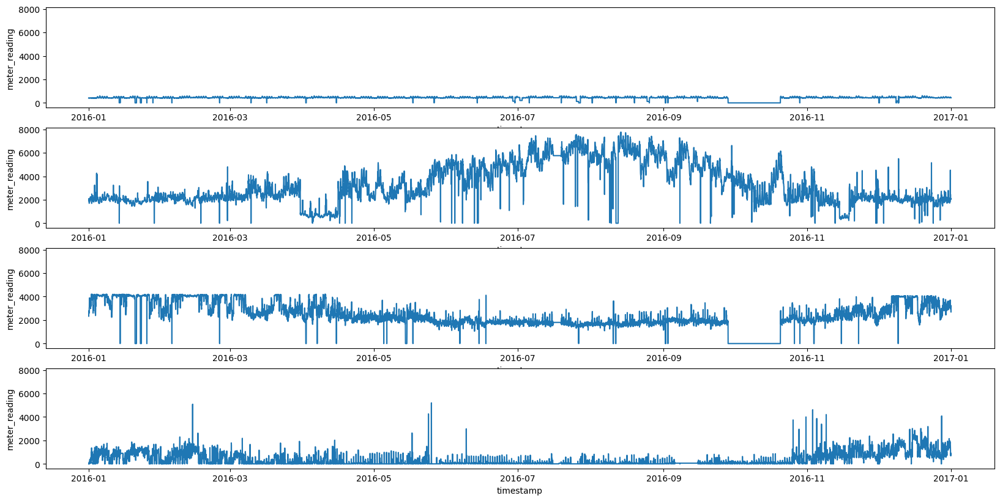

In [9]:
# building 1298 
temp_df = train_df[train_df["building_id"]==1298].reset_index(drop=True)
fig, axes = plt.subplots(4,1, figsize=(20, 10), sharey=True, dpi=100)
axes = axes.flatten()
sns.lineplot(x="timestamp", y='meter_reading',ax=axes[0],
                data=temp_df[temp_df['meter']==0])

sns.lineplot(x="timestamp", y="meter_reading",ax=axes[1],
                data=temp_df[temp_df['meter']==1])

sns.lineplot(x="timestamp", y="meter_reading",ax=axes[2],
                data=temp_df[temp_df['meter']==2])

sns.lineplot(x="timestamp", y="meter_reading",ax=axes[3],
                data=temp_df[temp_df['meter']==3])


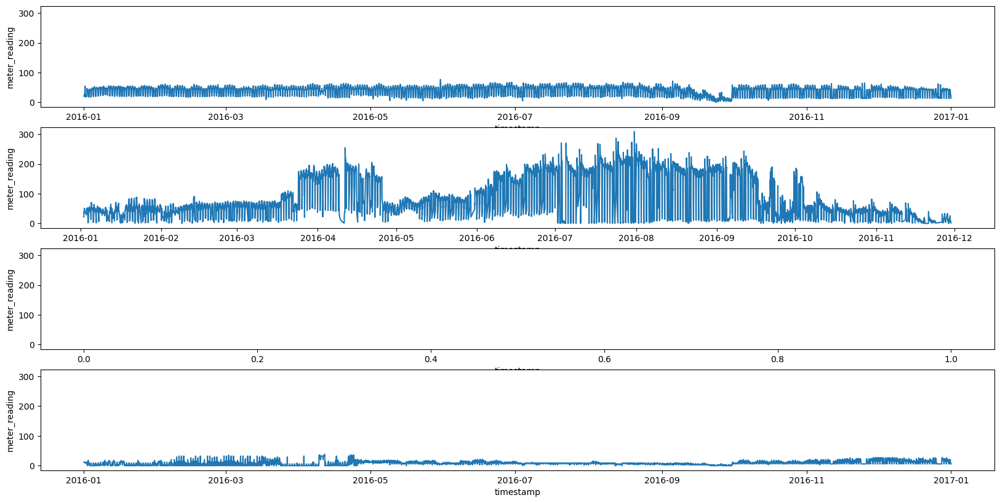

In [10]:
# building 184
temp_df = train_df[train_df["building_id"]==184].reset_index(drop=True)
fig, axes = plt.subplots(4,1, figsize=(20, 10), sharey=True, dpi=100)
axes = axes.flatten()
sns.lineplot(x="timestamp", y='meter_reading',ax=axes[0],
                data=temp_df[temp_df['meter']==0])

sns.lineplot(x="timestamp", y="meter_reading",ax=axes[1],
                data=temp_df[temp_df['meter']==1])

sns.lineplot(x="timestamp", y="meter_reading",ax=axes[2],
                data=temp_df[temp_df['meter']==2])

sns.lineplot(x="timestamp", y="meter_reading",ax=axes[3],
                data=temp_df[temp_df['meter']==3])


In [11]:
# Building Metadata

In [12]:
building_df = pd.read_csv("building_metadata.csv")
building_df.tail()

,site_id,building_id,primary_use,square_feet,year_built,floor_count
1444,15,1444,Entertainment/public assembly,19619,1914.0,NaN
1445,15,1445,Education,4298,NaN,NaN
1446,15,1446,Entertainment/public assembly,11265,1997.0,NaN
1447,15,1447,Lodging/residential,29775,2001.0,NaN
1448,15,1448,Office,92271,2001.0,NaN


<BarContainer object of 16 artists>

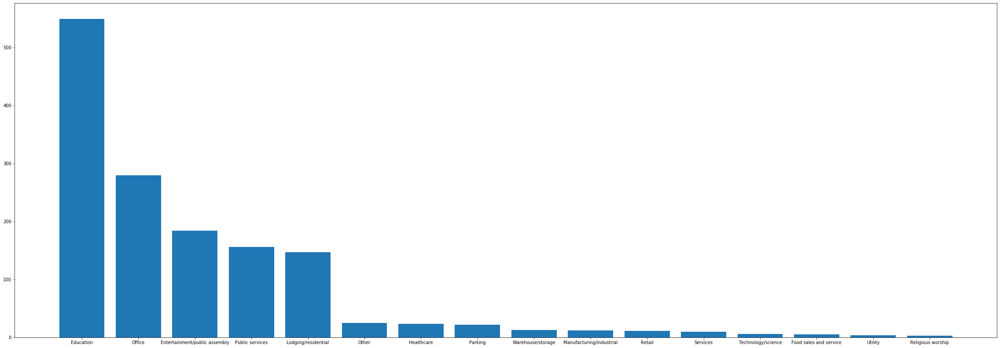

In [13]:

primary_use=building_df['primary_use'].value_counts().sort_values(ascending=False)
#primary_use=primary_use.sort_index()
plt.figure(figsize=(40,14))
plt.bar(primary_use.index,primary_use.values)

<BarContainer object of 18 artists>

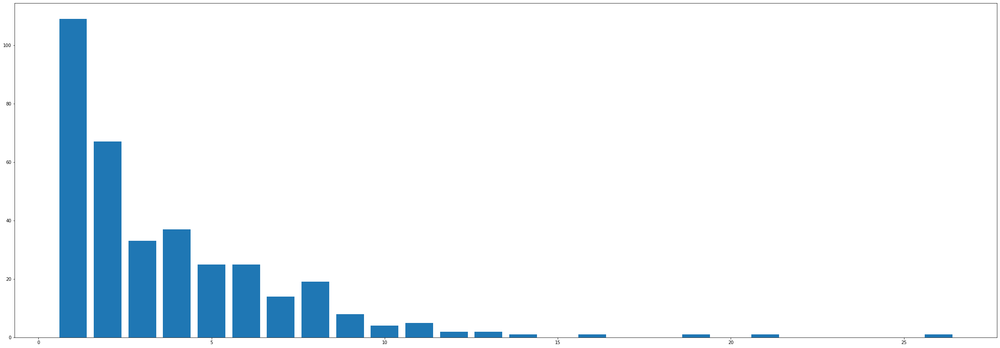

In [14]:
floor_count=building_df['floor_count'].value_counts().sort_values(ascending=False)
#primary_use=primary_use.sort_index()
plt.figure(figsize=(40,14))
plt.bar(floor_count.index,floor_count.values)

<BarContainer object of 116 artists>

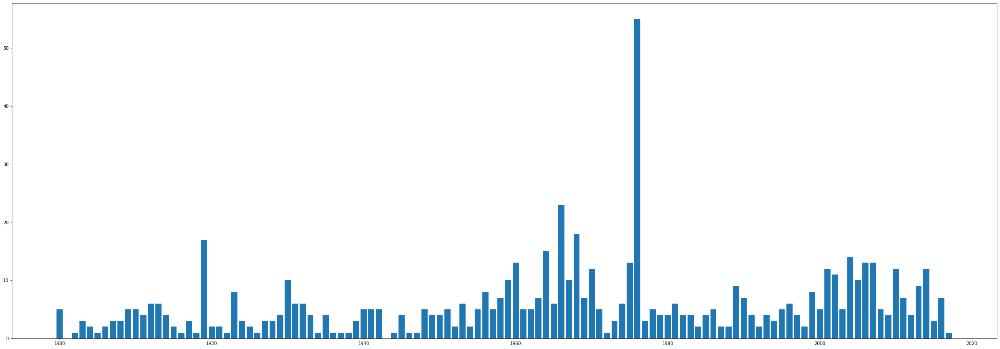

In [15]:
year_built=building_df['year_built'].value_counts().sort_values(ascending=False)
#primary_use=primary_use.sort_index()
plt.figure(figsize=(40,14))
plt.bar(year_built.index,year_built.values)

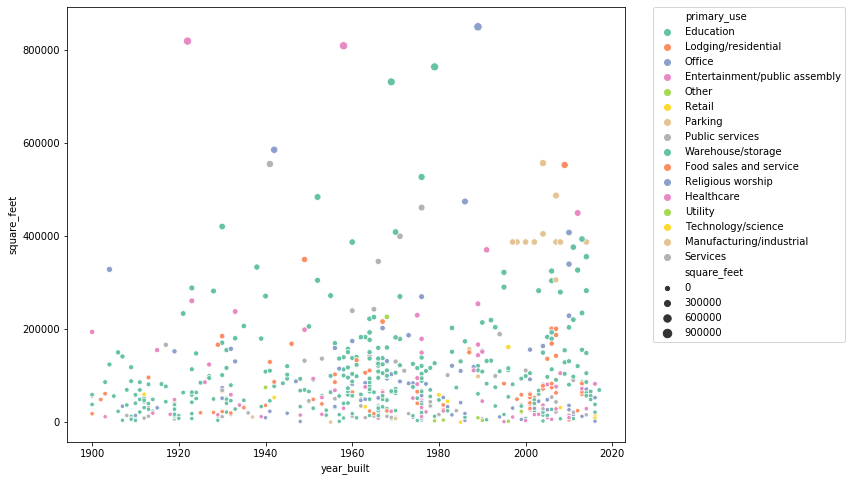

In [16]:
plt.figure(figsize=(10,8))
ax = sns.scatterplot(x="year_built", y="square_feet",
                   hue="primary_use", size="square_feet",palette="Set2",
                    data=building_df)
# putting legend outisde of the figure
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

<Figure size 720x576 with 0 Axes>

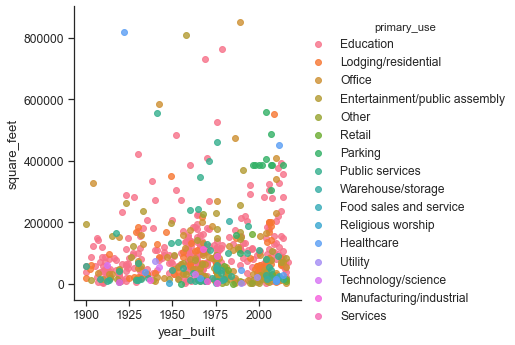

In [17]:

plt.figure(figsize=(10,8))
sns.set_context("notebook", font_scale=1.1)
sns.set_style("ticks")
sns.lmplot(x="year_built", y="square_feet", data=building_df, hue='primary_use', fit_reg=False)


In [18]:
# WEATHER DATA 

weather_df = pd.read_csv("weather_train.csv", parse_dates=["timestamp"])
weather_df.head()

,site_id,timestamp,air_temperature,cloud_coverage,dew_temperature,precip_depth_1_hr,sea_level_pressure,wind_direction,wind_speed
0,0,2016-01-01 00:00:00,25.0,6.0,20.0,NaN,1019.7,0.0,0.0
1,0,2016-01-01 01:00:00,24.4,NaN,21.1,-1.0,1020.2,70.0,1.5
2,0,2016-01-01 02:00:00,22.8,2.0,21.1,0.0,1020.2,0.0,0.0
3,0,2016-01-01 03:00:00,21.1,2.0,20.6,0.0,1020.1,0.0,0.0
4,0,2016-01-01 04:00:00,20.0,2.0,20.0,-1.0,1020.0,250.0,2.6


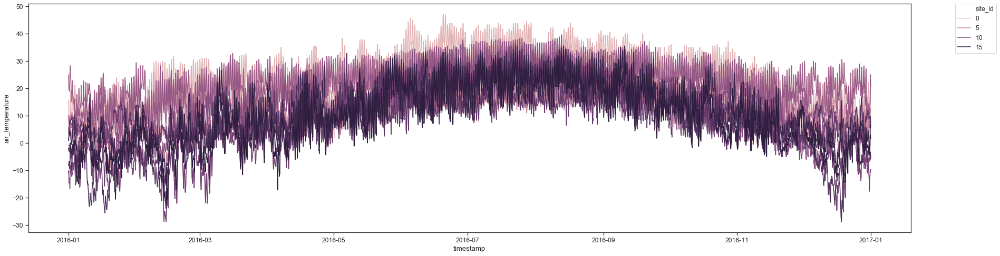

In [19]:
plt.figure(figsize=(30,8))
sns.lineplot(x="timestamp", y='air_temperature',hue="site_id",
                data=weather_df)
# putting legend outisde of the figure
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

# Overall it seems that the temperature increases in all the sites towards the middle of the year 
#and decreases at the end of year.

In [20]:
from bokeh.models import Panel, Tabs
from bokeh.io import output_notebook, show
from bokeh.plotting import figure

output_notebook()

def get_plots(df):
    p = figure(plot_width=1000, plot_height=350, x_axis_type="datetime", title="Air temperature distribution over time")
    p.line(df['timestamp'], df['air_temperature'], color='navy', alpha=0.5)
    return p

tab_list = []
for site in range(16):
    temp_df = weather_df[weather_df["site_id"]==site]
    p = get_plots(temp_df)
    tab = Panel(child=p, title=f"Site:{site}")
    tab_list.append(tab)

tabs = Tabs(tabs=tab_list)
show(tabs)


Loading BokehJS ...

In [21]:
from bokeh.models import Panel, Tabs
from bokeh.io import output_notebook, show
from bokeh.plotting import figure

output_notebook()

def get_plots(df, col, color):
    p = figure(plot_width=1000, plot_height=350, x_axis_type="datetime", title=f"{col} distribution over time")
    p.line(df['timestamp'], df[col], color=color, alpha=0.5)
    return p

col_map = {
    "dew_temperature": "Dew Temperature",
    "sea_level_pressure": "Sea Level Pressure",
    "wind_speed": "Wind Speed",
    "cloud_coverage": "Cloud Coverage",
}

color_map = {
    "dew_temperature": "brown",
    "sea_level_pressure": "green",
    "wind_speed": "red",
    "cloud_coverage": "blue",
}

main_tabs_list = []
cols = ["dew_temperature", "sea_level_pressure", "wind_speed", "cloud_coverage"]
for col in cols:
    tab_list = []
    for site in range(16):
        temp_df = weather_df[weather_df["site_id"]==site]
        p = get_plots(temp_df, col, color_map[col])
        tab = Panel(child=p, title=f"Site:{site}")
        tab_list.append(tab)
    tabs = Tabs(tabs=tab_list)
    panel = Panel(child=tabs, title=col_map[col])
    main_tabs_list.append(panel)

tabs = Tabs(tabs=main_tabs_list)
show(tabs)

Loading BokehJS ...